In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = ["15_EIPH_568320 berliner blau.svs", 
                         "22_EIPH_575216 Berliner Blau.svs", 
                         "30_EIPH_588355 Berliner Blau.svs", 
                         "19_EIPH_566933 L Tunrbull blue.svs", 
                         "02_EIPH_574162 Turnbull blue-001.svs", 
                        ]

slides_val = ["27_EIPH_571557 Turnbull blue.svs", "17_EIPH_575796 Berliner Blau.svs"]

In [7]:
grade_list = [0, 1]
annotations_path = Path("../../Statistics/EIPH_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)
annotations["image_name"] = [name.replace("tiff","svs") for name in annotations["image_name"]]
annotations = annotations[annotations["grade"].isin(grade_list)]
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_set,species,image_name,image_type,grade,vector,unique_identifier,user_id,deleted,last_editor,data_set_name,version
19314,1453268,3549,246,equine,15_EIPH_568320 berliner blau.svs,BerlinerBlau,0,"{'x1': 22287, 'x2': 22389, 'y1': 25395, 'y2': ...",190231f1-39c5-4de5-910a-c137ffc38e76,1,True,1,SDATA,Cluster
19315,1453269,3549,246,equine,15_EIPH_568320 berliner blau.svs,BerlinerBlau,0,"{'x1': 23030, 'x2': 23141, 'y1': 25124, 'y2': ...",74b8d1b6-4632-4c8c-b304-90c12685f017,1,False,1,SDATA,Inference
19316,1453270,3549,246,equine,15_EIPH_568320 berliner blau.svs,BerlinerBlau,0,"{'x1': 19613, 'x2': 19683, 'y1': 5604, 'y2': 5...",7862ba0e-99f4-407a-b397-625870f3de28,1,True,1,SDATA,Cluster
19317,1453271,3549,246,equine,15_EIPH_568320 berliner blau.svs,BerlinerBlau,0,"{'x1': 4342, 'x2': 4434, 'y1': 13810, 'y2': 13...",3386d235-9c38-406c-9b06-cd44031513e0,1,False,1,SDATA,Inference
19318,1453272,3549,246,equine,15_EIPH_568320 berliner blau.svs,BerlinerBlau,0,"{'x1': 10015, 'x2': 10089, 'y1': 9697, 'y2': 9...",727b28a3-2e05-42e7-b62b-2e065503af4d,1,True,1,SDATA,Cluster


In [8]:
slides_path = Path("../../../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs")  if slide.name in slides_train + slides_val}
files

{'02_EIPH_574162 Turnbull blue-001.svs': PosixPath('../../../Slides/Equine/02_EIPH_574162 Turnbull blue-001.svs'),
 '15_EIPH_568320 berliner blau.svs': PosixPath('../../../Slides/Equine/15_EIPH_568320 berliner blau.svs'),
 '17_EIPH_575796 Berliner Blau.svs': PosixPath('../../../Slides/Equine/17_EIPH_575796 Berliner Blau.svs'),
 '19_EIPH_566933 L Tunrbull blue.svs': PosixPath('../../../Slides/Equine/19_EIPH_566933 L Tunrbull blue.svs'),
 '22_EIPH_575216 Berliner Blau.svs': PosixPath('../../../Slides/Equine/22_EIPH_575216 Berliner Blau.svs'),
 '27_EIPH_571557 Turnbull blue.svs': PosixPath('../../../Slides/Equine/27_EIPH_571557 Turnbull blue.svs'),
 '30_EIPH_588355 Berliner Blau.svs': PosixPath('../../../Slides/Equine/30_EIPH_588355 Berliner Blau.svs')}

In [9]:
size = 1024 
level = 0
bs = 16
train_images = 2500
val_images = 1500
experiment_name = "EquineVsEquine"

In [10]:
train_files = []
val_files = []

for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [11]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      max_lighting=0.0,
                      max_zoom=1.,
                      max_warp=0.0,
                      p_affine=0.5,
                      p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (dihedral_affine), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10.0, 10.0)}, p=0.5, resolved={}, do_run=True, is_random=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True)])

In [12]:
def get_y_func(x):
    return x.y

In [13]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate).normalize()

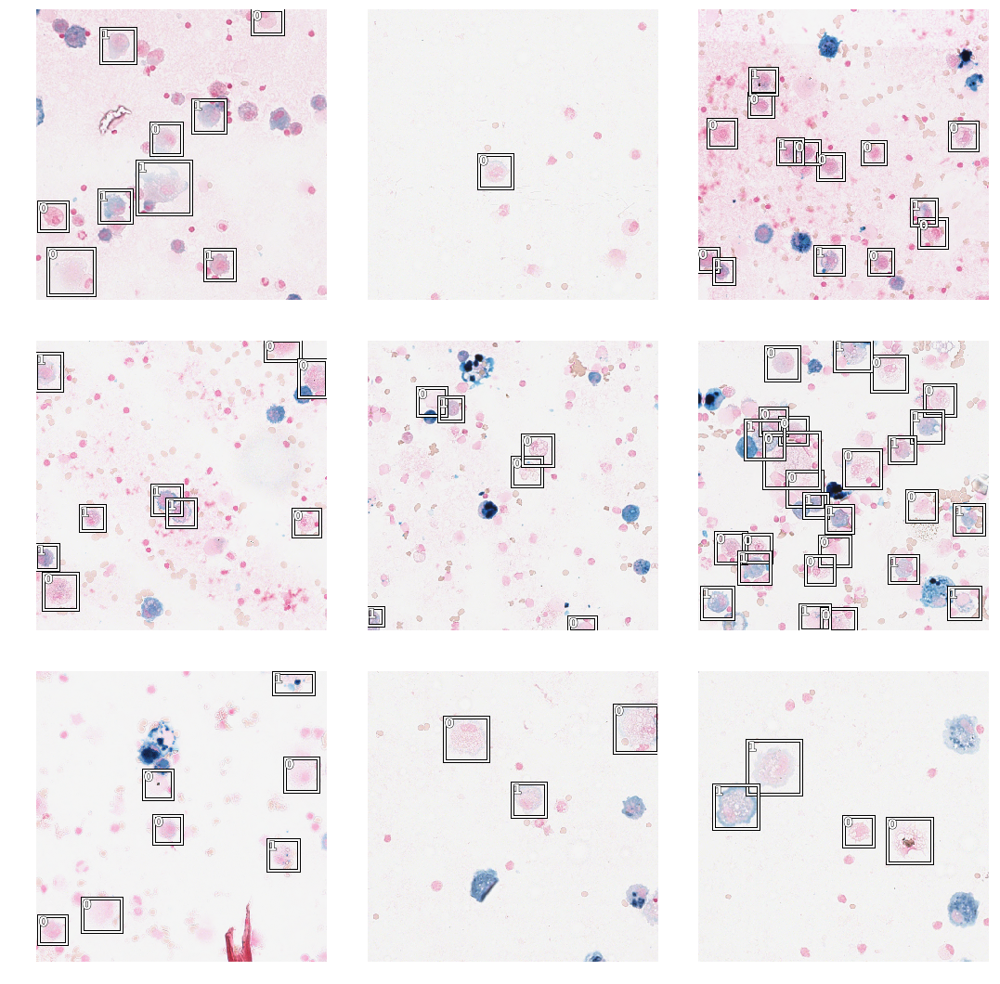

In [14]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

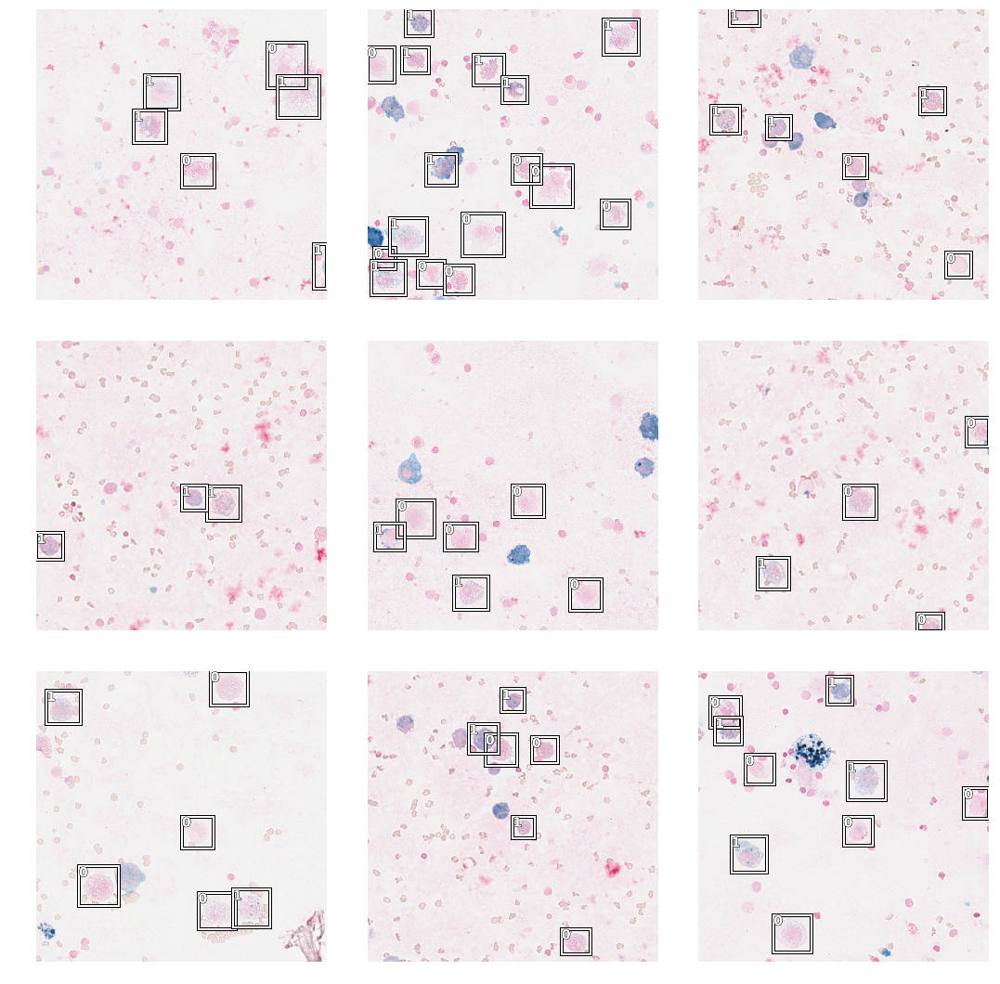

In [15]:
data.show_batch(rows=3, ds_type=DatasetType.Valid, figsize=(15,15))

In [16]:
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=[0.6, 0.7, 0.9, 1.25, 1.5])

In [17]:
crit = RetinaNetFocalLoss(anchors)
encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=5, sizes=[32], chs=128, final_bias=-4., n_conv=3)

In [18]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics, partial(CSVLogger, append=False, filename=experiment_name)], #BBMetrics, ShowGraph
                metrics=[voc]
               )

In [19]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [20]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-0,AP-1,time
0,0.480770,0.292965,0.757197,0.078335,0.214630,0.727365,0.787029,07:20
1,0.323040,0.409359,0.708998,0.109854,0.299504,0.764762,0.653234,07:28
2,0.267591,0.217752,0.830194,0.058860,0.158892,0.790407,0.869982,07:46
3,0.233388,0.186234,0.836423,0.054434,0.131799,0.804698,0.868148,07:39
4,0.226972,0.225171,0.750175,0.043805,0.181366,0.635882,0.864468,07:33
5,0.198261,0.174765,0.843993,0.036903,0.137861,0.781114,0.906872,07:07
6,0.183580,0.147251,0.861744,0.033720,0.113531,0.810727,0.912761,07:26
7,0.160823,0.151058,0.868342,0.034677,0.116381,0.839477,0.897207,07:36
8,0.146573,0.127260,0.877591,0.029027,0.098233,0.841071,0.914111,07:47
9,0.142099,0.129670,0.879980,0.029108,0.100562,0.848422,0.911539,07:38


In [21]:
import pickle

stats = {"anchors": anchors,
         "mean": to_np(data.stats[0]),
         "std": to_np(data.stats[1]),
         "size": size,
         "n_classes": 6,
         "n_anchors": 5,
         "sizes": [32],
         "chs": 128,
         "encoder": "RN-18",
         "n_conv": 3,
         "level": 0,
         "model": get_model(learn.model).state_dict()
        }

torch.save(stats, "{}.p".format(experiment_name))

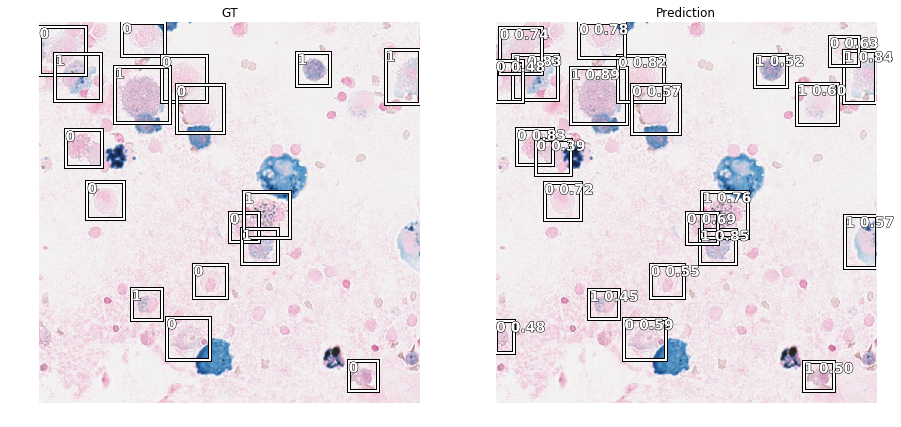

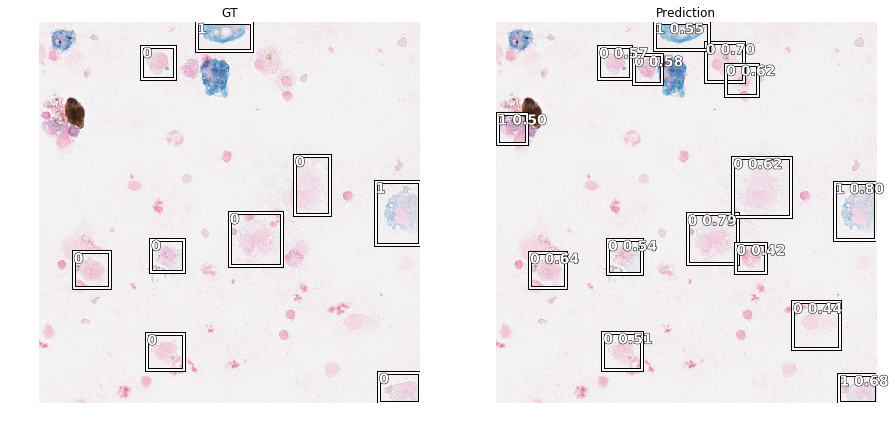

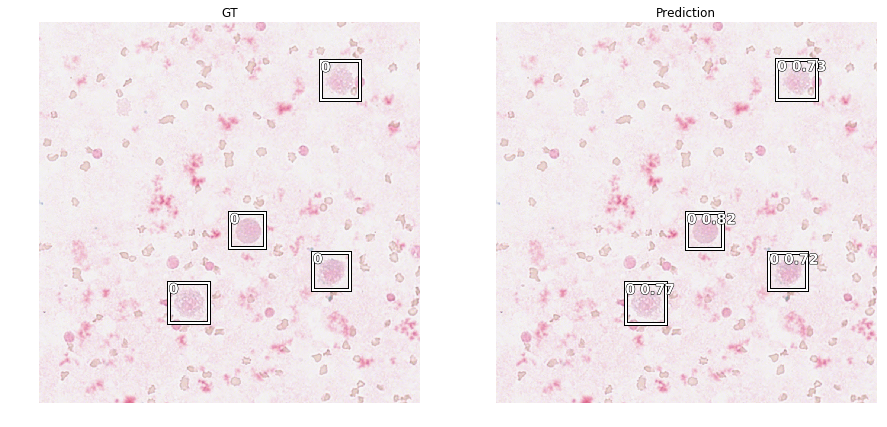

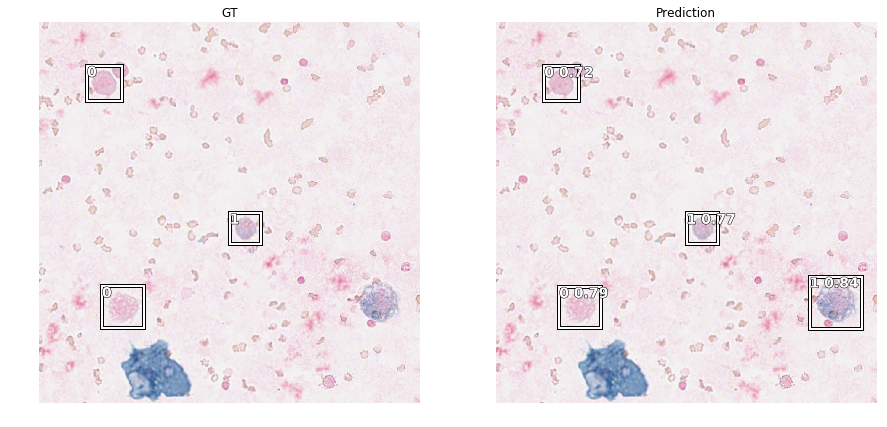

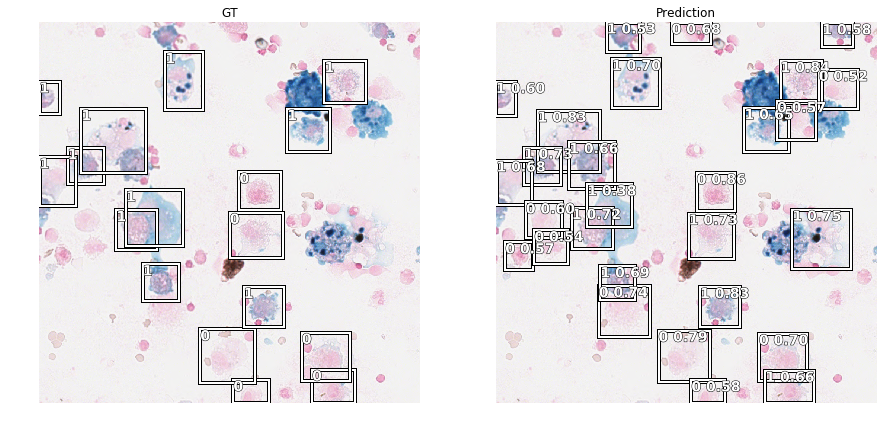

...

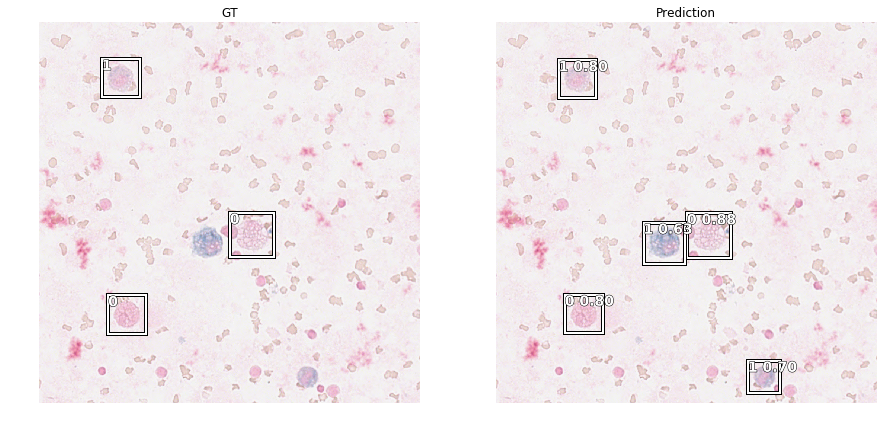

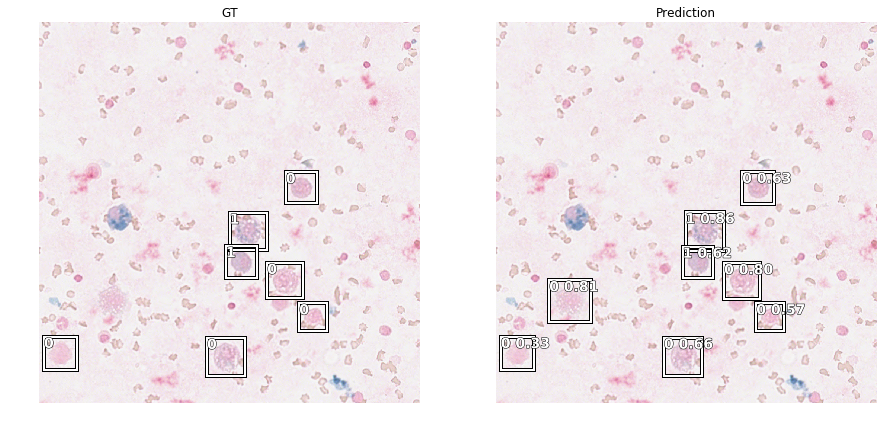

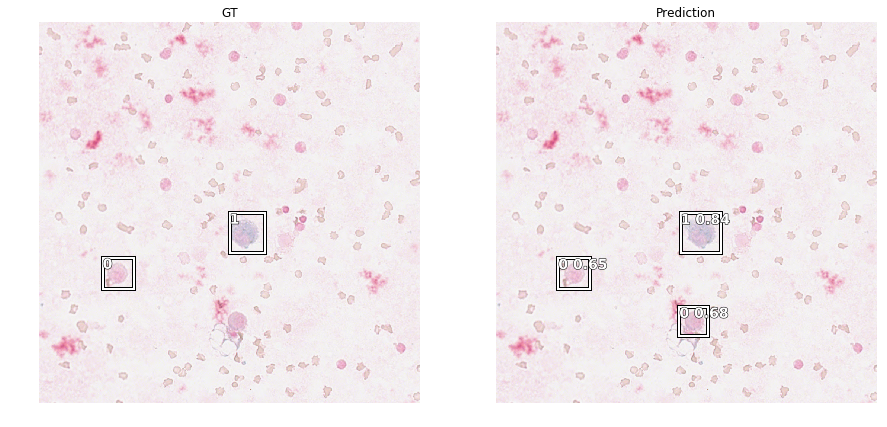

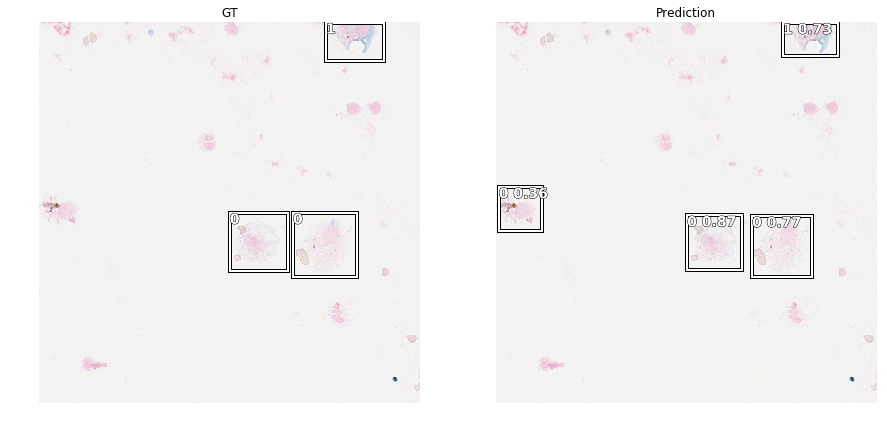

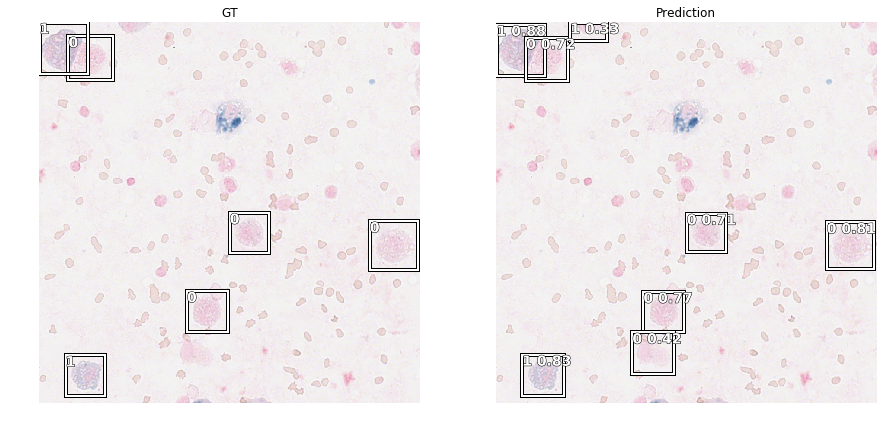

In [22]:
slide_object_result(learn, anchors, detect_thresh=0.3, nms_thresh=0.2, image_count=20)